In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from dpk import model_objs, koopman_probabilistic
import datetime as dt
import xarray as xr

sns.set_theme()

In [2]:
# reproducibility
seed = 633

print("[ Using Seed : ", seed, " ]")

import torch
import random
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)
torch.cuda.manual_seed(seed)
np.random.seed(seed)
random.seed(seed)
torch.backends.cudnn.deterministic = True

[ Using Seed :  633  ]


In [3]:
K = 200
name = "WPCA_3-16-2018-3-16-2020"
V = np.load(f"{name}_rank{K}V.npy")
rank = 20
V = V[:, :rank]
V.shape

(17544, 20)

In [4]:
scales = V.std(axis=0, keepdims=True)
x = V / scales

In [9]:
periods = np.array([24, 24 * 7, 24 * 365.24], dtype=np.float64)  # hours
l1width = 256
l2width = 1024
wd = 1e-3
lrt = 1e-4
param_str = f"NormalNLL_{rank}_{l1width}_{l2width}_{32}_{400}_{seed}_{wd}_{lrt}"
model = model_objs.NormalNLL(x_dim=rank, num_freqs=3, n=l1width, n2=l2width)
model.load_state_dict(torch.load(f"forecasts/model_{param_str}.pt"))

<All keys matched successfully>

In [10]:
k = koopman_probabilistic.KoopmanProb(model, batch_size=32, device="cpu")
k.init_periods(periods)

In [11]:
total_iters = 0

In [121]:
iters = 200
total_iters += iters
k.fit(x, iterations=iters, cutoff=0, weight_decay=wd, lr_theta=lrt, lr_omega=0, verbose=True)

Iteration  0
tensor([  24.0000,  168.0000, 8765.7598,   24.0000,  168.0000, 8765.7598])
Setting periods to tensor([  24.0000,  168.0000, 8765.7598,   24.0000,  168.0000, 8765.7598],
       grad_fn=<MulBackward0>)
Loss:  0.2929433
Iteration  1
tensor([  24.0000,  168.0000, 8765.7598,   24.0000,  168.0000, 8765.7598])
Setting periods to tensor([  24.0000,  168.0000, 8765.7598,   24.0000,  168.0000, 8765.7598],
       grad_fn=<MulBackward0>)
Loss:  0.29277572
Iteration  2
tensor([  24.0000,  168.0000, 8765.7598,   24.0000,  168.0000, 8765.7598])
Setting periods to tensor([  24.0000,  168.0000, 8765.7598,   24.0000,  168.0000, 8765.7598],
       grad_fn=<MulBackward0>)
Loss:  0.29264927
Iteration  3
tensor([  24.0000,  168.0000, 8765.7598,   24.0000,  168.0000, 8765.7598])
Setting periods to tensor([  24.0000,  168.0000, 8765.7598,   24.0000,  168.0000, 8765.7598],
       grad_fn=<MulBackward0>)
Loss:  0.29245922
Iteration  4
tensor([  24.0000,  168.0000, 8765.7598,   24.0000,  168.0000, 8

[0.2929433,
 0.29277572,
 0.29264927,
 0.29245922,
 0.29238462,
 0.29226032,
 0.2920725,
 0.29192793,
 0.29178563,
 0.29162443,
 0.29151967,
 0.29137695,
 0.2912481,
 0.2910884,
 0.2909909,
 0.29084098,
 0.2906738,
 0.2905417,
 0.29040593,
 0.29030716,
 0.29017702,
 0.29004973,
 0.2899157,
 0.28979242,
 0.28964964,
 0.28953522,
 0.28942922,
 0.28928003,
 0.28916246,
 0.2889886,
 0.2889182,
 0.28874865,
 0.28865543,
 0.28852162,
 0.28842023,
 0.28832844,
 0.28814998,
 0.28807893,
 0.28797713,
 0.28778338,
 0.28768376,
 0.28760213,
 0.28749987,
 0.28733364,
 0.28723115,
 0.2871401,
 0.28703326,
 0.2869321,
 0.286794,
 0.28672606,
 0.28657416,
 0.28647408,
 0.2863674,
 0.2862586,
 0.28614208,
 0.28601727,
 0.2859505,
 0.28582743,
 0.28569856,
 0.28565195,
 0.28548282,
 0.28540444,
 0.28531033,
 0.2851768,
 0.28513944,
 0.28500473,
 0.2848869,
 0.28475523,
 0.2846767,
 0.2845531,
 0.28449354,
 0.28437355,
 0.2842935,
 0.28416523,
 0.28408453,
 0.28394324,
 0.28386158,
 0.283764,
 0.2836567

In [11]:
start_date = dt.datetime(2018, 1, 1)
end_date = dt.datetime(2020, 3, 16)
increment = dt.timedelta(days=1)  # each file contains 1 day of data
T = ((end_date - start_date).days) * 24
backH = T - V.shape[0]

H = np.arange(-backH, V.shape[0])  # hindcast
params = k.predict(H)
params = model.rescale(loc=0, scale=scales, params=params)
mean_hat = model.mean(params)
std_hat = model.std(params)

In [13]:
param_str = f"NormalNLL_{rank}_{l1width}_{l2width}_{k.batch_size}_{total_iters}_{seed}_{wd}_{lrt}"
np.save(f"forecasts/params_{param_str}.npy", np.array(params))
torch.save(model.state_dict(), f"forecasts/model_{param_str}.pt")

In [14]:
backH

1752

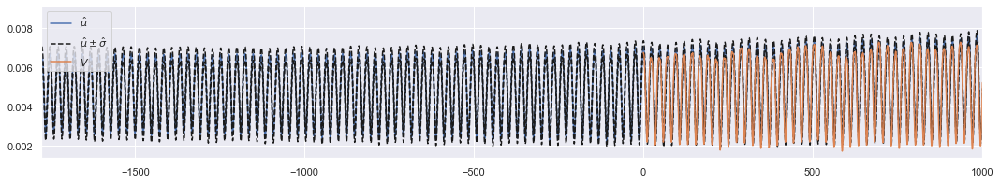

In [12]:
i = 0
plt.figure(figsize=(18, 3))
plt.plot(H, mean_hat[:, i], label="$\hat \mu$")
plt.plot(H, mean_hat[:, i] + std_hat[:, i], "--k", label="$\hat \mu \pm \hat \sigma$")
plt.plot(H, mean_hat[:, i] - std_hat[:, i], "--k")
plt.plot(H[backH:], V[:, i], label="$V$")
plt.xlim([-backH, 1000])
plt.legend()

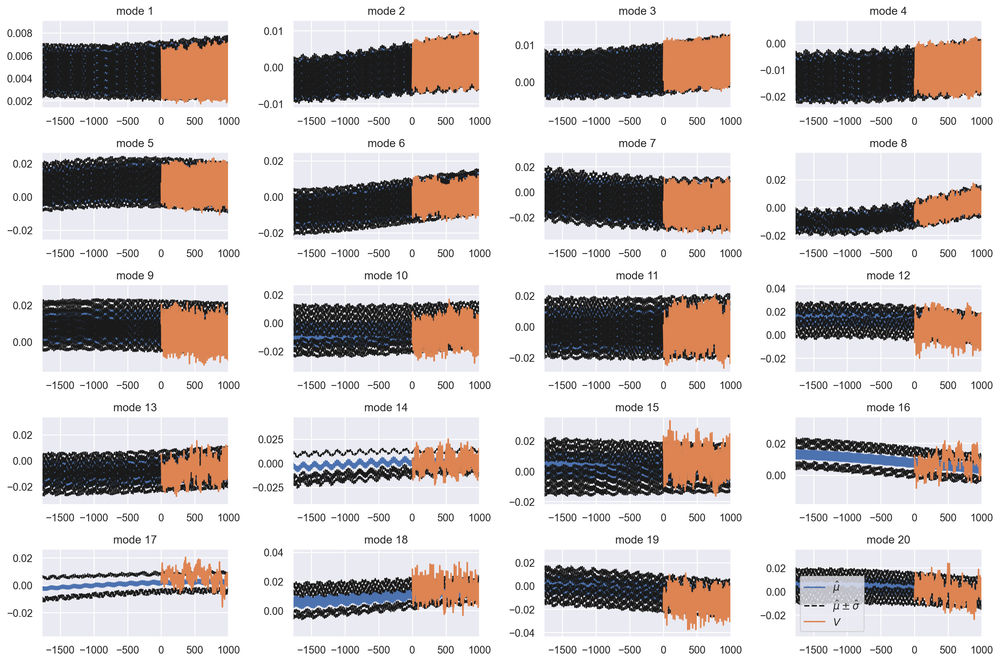

In [13]:
plt.subplots(5, 2, figsize=(15, 10), dpi=200)
start = 0
for i in range(start, start + 20):
    plt.subplot(5, 4, i + 1 - start)
    plt.title(f"mode {i + 1}")
    plt.plot(H, mean_hat[:, i], label="$\hat \mu$")
    plt.plot(H, mean_hat[:, i] + std_hat[:, i], "--k", label="$\hat \mu \pm \hat \sigma$")
    plt.plot(H, mean_hat[:, i] - std_hat[:, i], "--k")
    plt.plot(H[backH:], V[:, i], label="$V$")
    plt.xlim([-backH, 1000])
plt.tight_layout()
plt.legend()
plt.show()

# Compute MSE of central estimate

In [14]:
U = np.load(f"D:/atmo-chem/{name}_rank{K}U.npy")[:, :rank]
spatial_means = np.load(f"{name}_spatial_means.npy")
pop_weight = np.load(f"pop_weight.npy")
s = np.load(f"{name}_rank{K}sigmas.npy")

In [15]:
U.shape

(1038240, 20)

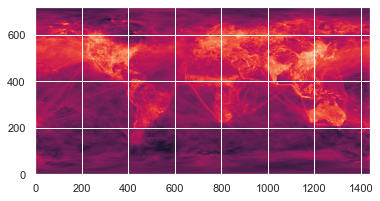

In [16]:
plt.imshow(spatial_means.reshape(721, 1440), origin="lower")

In [17]:
start_date = dt.datetime(2018, 1, 1)
current_date = start_date
end_date = dt.datetime(2018, 3, 16)
increment = dt.timedelta(days=1)  # each file contains 1 day of data
T = ((end_date - current_date).days) * 24

WMSE_over_time = np.zeros(721 * 1440)
MSE_over_time = np.zeros(721 * 1440)
mean_pred_std = np.zeros(721 * 1440)
seattle_pixel = (560, 230)
seattle_mean = np.zeros(T)
seattle_std = np.zeros(T)
seattle_actual = np.zeros(T)

t = 0
while current_date < end_date:
    print("working on", current_date)
    data = xr.open_dataset(r"D:atmo-chem/data/NO2_" + str(current_date)[:10] + ".nc4")
    darr = data.to_array()[0, :, 0, :, :].to_numpy()  # remove elev and species dimensions
    
    flattened = darr.reshape((darr.shape[0], darr.shape[1] * darr.shape[2])).T  # flatten image
    
    A = np.log(flattened + 1e-30) - spatial_means
    
    # reconstruct A
    prediction = U[:, :rank] @ np.diag(s[:rank]) @ mean_hat[t:t + A.shape[1], :].T
    prediction /= pop_weight  # weighted PCA
    this_mse = np.sum(((prediction - A)**2), axis=1)
    this_wmse = np.sum((pop_weight * (prediction - A)**2), axis=1) / np.sum(pop_weight)
    MSE_over_time += this_mse / T
    WMSE_over_time += this_wmse / T
    print("\tMSE:", this_mse.mean(), "WMSE", this_wmse.mean())

    # reconstruct the A probabilistically
    pred_mean = U[:, :rank] @ np.diag(s[:rank]) @ mean_hat[t:t + A.shape[1], :].T
    pred_mean /= pop_weight  # weighted PCA
    pred_var = ((U[:, :rank] @ np.diag(s[:rank]))**2) @ (std_hat[t:t + A.shape[1], :].T**2)
    pred_var /= pop_weight**2  # weighted PCA
    pred_std = np.sqrt(pred_var)
    mean_pred_std += pred_std.sum(axis=1) / T

    seattle_mean[t:t + A.shape[1]] = pred_mean.reshape((721, 1440, 24))[seattle_pixel]
    seattle_std[t:t + A.shape[1]] = pred_std.reshape((721, 1440, 24))[seattle_pixel]
    seattle_actual[t:t + A.shape[1]] = A.reshape((721, 1440, 24))[seattle_pixel]

    current_date += increment
    t += A.shape[1]
RMSE_over_time = np.sqrt(MSE_over_time)
WRMSE_over_time = np.sqrt(WMSE_over_time)

working on 2018-01-01 00:00:00
	MSE: 15.183165821326721 WMSE 1.2658359877435967e-05
working on 2018-01-02 00:00:00
	MSE: 14.862147260544942 WMSE 1.2278941518263754e-05
working on 2018-01-03 00:00:00
	MSE: 15.381844573379102 WMSE 1.2652313186239153e-05
working on 2018-01-04 00:00:00
	MSE: 17.061179687721587 WMSE 1.271843036222834e-05
working on 2018-01-05 00:00:00
	MSE: 17.01641322930015 WMSE 1.2673996404034968e-05
working on 2018-01-06 00:00:00
	MSE: 18.183201182102273 WMSE 1.2739270363526156e-05
working on 2018-01-07 00:00:00
	MSE: 18.561436767792898 WMSE 1.2880335400383875e-05
working on 2018-01-08 00:00:00
	MSE: 16.22107687707025 WMSE 1.2589698865741725e-05
working on 2018-01-09 00:00:00
	MSE: 15.739411289691061 WMSE 1.228759411269225e-05
working on 2018-01-10 00:00:00
	MSE: 16.26251361123673 WMSE 1.235462195635105e-05
working on 2018-01-11 00:00:00
	MSE: 15.808121455662182 WMSE 1.2168772374465308e-05
working on 2018-01-12 00:00:00
	MSE: 15.334601874520622 WMSE 1.28804906580891e-05


In [18]:
spatiotemporal_std = np.load("spatiotemporalSTD3-16-2018-3-16-2020.npy")
spatiotemporal_wstd = np.load("spatiotemporalWSTD3-16-2018-3-16-2020.npy")
NRMSE = np.sqrt(np.mean(MSE_over_time)) / spatiotemporal_std
WNRMSE = np.sqrt(np.sum(WMSE_over_time)) / spatiotemporal_wstd
NRMSE, WNRMSE

(0.5575867155858815, 0.5043694806532338)

In [19]:
mean_pred_std.mean()

0.258724063628272

In [20]:
train_rmse_over_time = np.load(f"RMSE_over_time_{name}_rank{rank}.npy")
seattle_std += train_rmse_over_time.reshape((721, 1440))[seattle_pixel]

In [21]:
mean_pred_std.mean()

0.258724063628272

In [22]:
train_rmse_over_time.mean(), mean_pred_std.mean()

(0.6983221582270144, 0.258724063628272)

In [23]:
train_rmse_over_time.reshape((721, 1440))[seattle_pixel], seattle_std.mean()

(1.002342979771693, 1.3427751603707594)

C:\Users\ATMal\AppData\Local\Temp/ipykernel_4032/640051775.py:4: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  plt.colorbar()


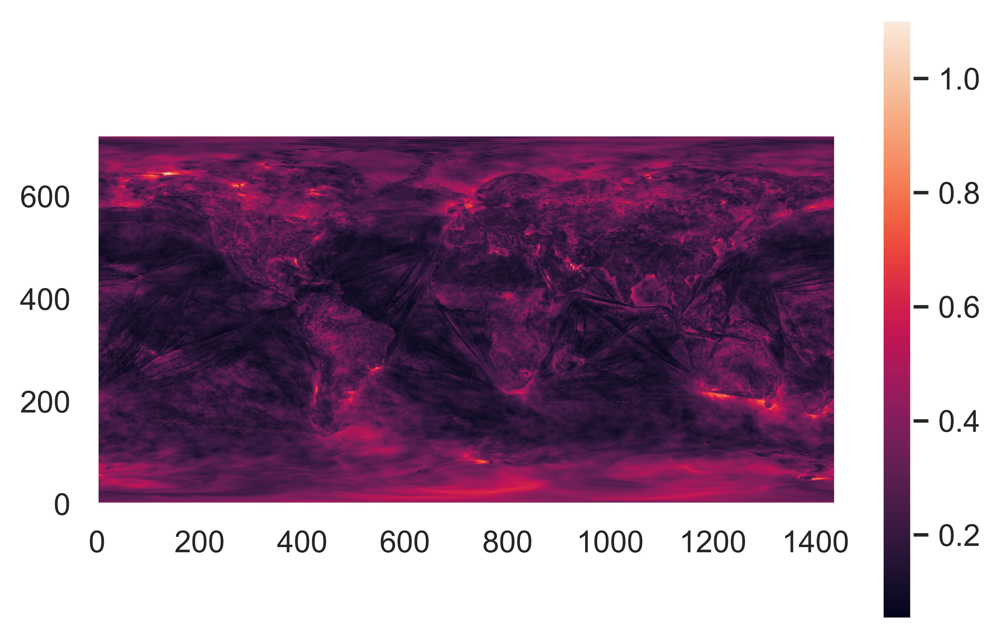

In [24]:
plt.figure(dpi=1000)
plt.imshow((mean_pred_std * (pop_weight[:, 0] > 0/254)).reshape((721, 1440)), origin="lower")
plt.grid()
plt.colorbar()

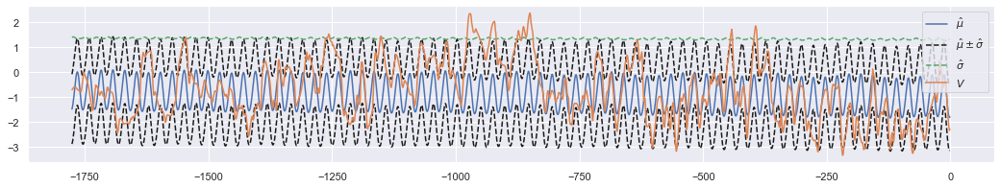

In [25]:
plt.figure(figsize=(18, 3))
plt.plot(H[:backH], seattle_mean[:], label="$\hat \mu$")
plt.plot(H[:backH], seattle_mean[:] + seattle_std[:], "--k", label="$\hat \mu \pm \hat \sigma$")
plt.plot(H[:backH], seattle_mean[:] - seattle_std[:], "--k")
plt.plot(H[:backH], seattle_std[:], "--g", label="$\hat \sigma$")
plt.plot(H[:backH], seattle_actual[:], label="$V$")
# plt.xlim([-backH, 1000])
plt.legend()

Text(0, 0.5, 'count')

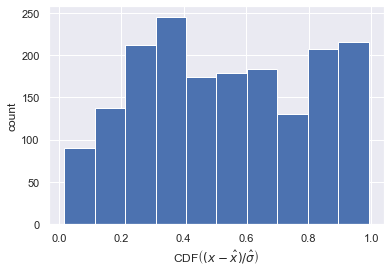

In [35]:
from scipy.stats import norm
cdf = norm.cdf((seattle_actual - seattle_mean)/seattle_std)
plt.hist(cdf)
plt.xlabel("CDF$\left((x-\hat x)/\hat \sigma\\right)$")
plt.ylabel("count")

C:\Users\ATMal\AppData\Local\Temp/ipykernel_14880/3370031317.py:3: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  plt.colorbar()


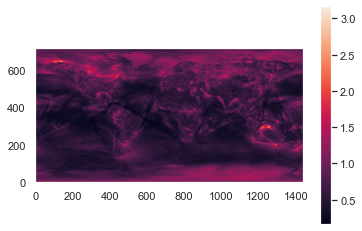

In [24]:
plt.imshow(RMSE_over_time.reshape(721, 1440), origin="lower")
plt.grid()
plt.colorbar()
plt.show()

C:\Users\ATMal\AppData\Local\Temp/ipykernel_14880/3758101269.py:3: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  plt.colorbar()


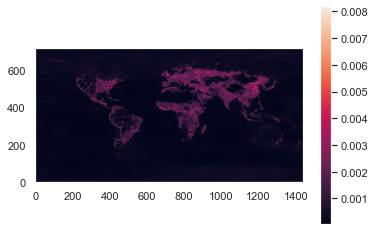

In [25]:
plt.imshow(WRMSE_over_time.reshape(721, 1440), origin="lower")
plt.grid()
plt.colorbar()
plt.show()

C:\Users\ATMal\AppData\Local\Temp/ipykernel_12368/2609468622.py:2: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  plt.colorbar()


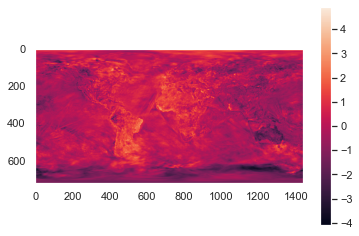

C:\Users\ATMal\AppData\Local\Temp/ipykernel_12368/2609468622.py:7: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  plt.colorbar()


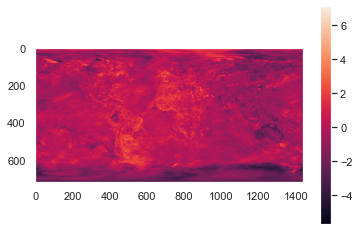

C:\Users\ATMal\AppData\Local\Temp/ipykernel_12368/2609468622.py:11: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  plt.colorbar()


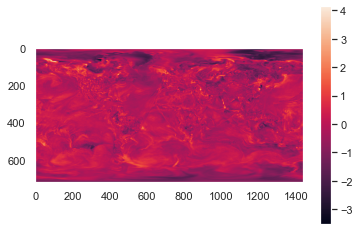

In [56]:
plt.imshow(prediction.reshape((721, 1440, 24))[::-1, :, 5] / A.std())
plt.colorbar()
plt.grid()
plt.show()
plt.imshow(A.reshape((721, 1440, 24))[::-1, :, 5] / A.std())
plt.grid()
plt.colorbar()
plt.show()
plt.imshow((A.reshape((721, 1440, 24)) - prediction.reshape((721, 1440, 24)))[::-1, :, 5] / A.std())
plt.grid()
plt.colorbar()
plt.show()

# compare DPK on hindcast vs covid data

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from dpk import model_objs, koopman_probabilistic
import datetime as dt
import xarray as xr
import torch

sns.set_theme()

In [13]:
K = 200
name = "WPCA_3-16-2018-3-16-2020"
V = np.load(f"{name}_rank{K}V.npy")
rank = 100
V = V[:, :rank]
scales = V.std(axis=0, keepdims=True)

In [15]:
periods = np.array([24, 24 * 7, 24 * 365.24], dtype=np.float64)  # hours
l1width = 256
l2width = 1024
wd = 1e-3
lrt = 1e-4
param_str = "NormalNLL_100_256_1024_32_600_633_0.0001_0.0001"
model = model_objs.NormalNLL(x_dim=rank, num_freqs=3, n=l1width, n2=l2width)
model.load_state_dict(torch.load(f"forecasts/model_{param_str}.pt"))
k = koopman_probabilistic.KoopmanProb(model, batch_size=32, device="cpu")
k.init_periods(periods)
total_iters = 0
iters = 200
total_iters += iters

start_date = dt.datetime(2018, 1, 1)
end_date = dt.datetime(2020, 7, 1)
increment = dt.timedelta(days=1)  # each file contains 1 day of data
T = ((end_date - start_date).days) * 24
backH = (dt.datetime(2018, 3, 16) - start_date).days * 24

H = np.arange(-backH, T - backH)  # hindcast
params = k.predict(H)
params = model.rescale(loc=0, scale=scales, params=params)
mean_hat = model.mean(params)
std_hat = model.std(params)
backH

1776

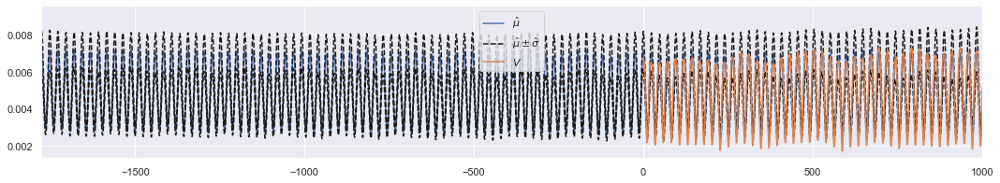

In [17]:
i = 0
plt.figure(figsize=(18, 3))
plt.plot(H, mean_hat[:, i], label="$\hat \mu$")
plt.plot(H, mean_hat[:, i] + std_hat[:, i], "--k", label="$\hat \mu \pm \hat \sigma$")
plt.plot(H, mean_hat[:, i] - std_hat[:, i], "--k")
plt.plot(H[backH:backH + V.shape[0]], V[:, i], label="$V$")
plt.xlim([-backH, 1000])
plt.legend()

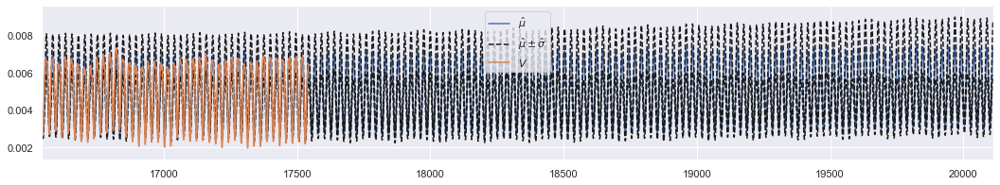

In [19]:
i = 0
plt.figure(figsize=(18, 3))
plt.plot(H, mean_hat[:, i], label="$\hat \mu$")
plt.plot(H, mean_hat[:, i] + std_hat[:, i], "--k", label="$\hat \mu \pm \hat \sigma$")
plt.plot(H, mean_hat[:, i] - std_hat[:, i], "--k")
plt.plot(H[backH:backH + V.shape[0]], V[:, i], label="$V$")
plt.xlim([V.shape[0] - 1000, T - backH])
plt.legend()

In [20]:
U = np.load(f"D:/atmo-chem/{name}_rank{K}U.npy")[:, :rank]
spatial_means = np.load(f"{name}_spatial_means.npy")
pop_weight = np.load(f"pop_weight.npy")
s = np.load(f"{name}_rank{K}sigmas.npy")

(1038240,)

In [291]:
import pandas as pd
import os

obs_dir = r"C:\Users\ATMal\PycharmProjects\koopman-forecasting\atmo_chem\stations"
observs = []
for fname in os.listdir(obs_dir):
    if fname.startswith("obs") and np.random.random() < 1:
        obsfile = os.path.join(obs_dir, fname)
        obs = pd.read_csv(obsfile,parse_dates=['ISO8601'],date_parser=lambda x: dt.datetime.strptime(x, '%Y-%m-%dT%H:%M:%SZ')).sort_values(by=['ISO8601'])
        obs = obs.query("obstype == \'no2\'")
        obs.index = obs.ISO8601
        obs["error"] = np.nan
        obs["logdpk"] = np.nan
        obs["logdpk_std"] = np.nan
        if len(obs) > 0:
            observs.append(obs)

In [292]:
len(observs)

40

In [293]:
observs[0].index[0]

Timestamp('2017-12-31 23:00:00')

In [294]:
observs[0].loc[pd.Timestamp(2017, 12, 31, 23)]

ISO8601                  2017-12-31 23:00:00
original_station_name      EEA_DE_DE_DEBY089
lat                                  48.1732
lon                                   11.648
obstype                                  no2
conc_obs                             21.6356
conc_obs.1                           21.6356
conc_unit                               ppbv
error                                    NaN
logdpk                                   NaN
logdpk_std                               NaN
Name: 2017-12-31 23:00:00, dtype: object

In [295]:
obs_coords = np.zeros((len(observs), 2))
for i, obs in enumerate(observs):
    lat, lon = obs.lat[0], obs.lon[0]
    obs_coords[i, :] = (lat, lon)
obs_coords

array([[  48.1732,   11.648 ],
       [  51.0338,    6.4515],
       [  51.3877,    7.002 ],
       [  36.1905,   -5.4358],
       [  40.5181,   -3.7744],
       [  43.6236,    1.4386],
       [  45.5647,    5.9283],
       [  37.9782,   23.7268],
       [  64.0042,  -22.584 ],
       [  50.9421,   17.2913],
       [  51.0674,   19.4487],
       [  54.5462,   17.7462],
       [  43.8755,   25.9317],
       [  59.8601,   17.6357],
       [  48.4367,   17.0197],
       [  35.68  ,  139.69  ],
       [ -34.0667,  150.7953],
       [  22.5625,  114.117 ],
       [  22.6054,  120.3076],
       [  24.066 ,  120.5415],
       [  25.4792,  118.981 ],
       [  26.2431,  105.9408],
       [  26.5892,  104.8   ],
       [  27.8094,  102.3419],
       [  34.5667,  117.732 ],
       [  36.1912,  113.1569],
       [  38.9846,  117.3747],
       [  39.6407,  118.1853],
       [  41.2742,   -8.3761],
       [  42.006 ,   21.387 ],
       [  43.4569,   87.4651],
       [  47.0677,    8.3007],
       [

In [296]:
from scipy.interpolate import griddata

In [297]:
latlongrid = np.mgrid[-90:90:721j, -180:179.75:1440j]
l1, l2 = latlongrid
latlon = l1.flatten(), l2.flatten()
latlon[0].shape
is_relevant = np.zeros(latlongrid[0].shape, dtype=bool)
for c in obs_coords:
    region = ((c[0] - 0.25 <= latlongrid[0]) & (latlongrid[0] <= c[0] + 0.25)) \
            & ((c[1] - 0.25 <= latlongrid[1]) & (latlongrid[1] <= c[1] + 0.25))
    is_relevant = is_relevant | region
is_relevant = is_relevant.flatten()

In [298]:
train_rmse_over_time = np.load(f"RMSE_over_time_{name}_rank{rank}.npy")
selective_train_rmse_over_time = train_rmse_over_time[is_relevant]

In [299]:
start_date = dt.datetime(2020, 3, 16)
current_date = start_date
end_date = dt.datetime(2021, 1, 1)
increment = dt.timedelta(days=1)  # each file contains 1 day of data
T = ((end_date - current_date).days) * 24

# WMSE_over_time = np.zeros(721 * 1440)
# MSE_over_time = np.zeros(721 * 1440)
# mean_pred_std = np.zeros(721 * 1440)
# seattle_pixel = (560, 230)
# seattle_mean = np.zeros(T)
# seattle_std = np.zeros(T)
# seattle_actual = np.zeros(T)
selective_U = U[is_relevant, :]
selective_pop_weight = pop_weight[is_relevant, :]
selective_spatial_means = spatial_means[is_relevant, :]
selective_latlon = (latlon[0][is_relevant], latlon[1][is_relevant])

t = 0
while current_date < end_date:
    print("working on", current_date)
    # data = xr.open_dataset(r"D:atmo-chem/data/NO2_" + str(current_date)[:10] + ".nc4")
    # darr = data.to_array()[0, :, 0, :, :].to_numpy()  # remove elev and species dimensions
    
    # flattened = darr.reshape((darr.shape[0], darr.shape[1] * darr.shape[2])).T  # flatten image
    
    # A = np.log(flattened + 1e-30) - spatial_means
    
    # reconstruct part of A
    pred_mean = selective_U[:, :rank] @ np.diag(s[:rank]) @ mean_hat[t:t + A.shape[1], :].T
    pred_mean /= selective_pop_weight  # weighted PCA
    pred_mean += selective_spatial_means

    pred_var = ((selective_U[:, :rank] @ np.diag(s[:rank]))**2) @ (std_hat[t:t + A.shape[1], :].T**2)
    pred_var /= selective_pop_weight**2  # weighted PCA
    pred_std = np.sqrt(pred_var)
    for i in range(24):
        loc = pd.Timestamp(current_date.year, current_date.month, current_date.day, i)
        snapshot_mean = pred_mean[:, i] + np.log(1e9)
        snapshot_std = pred_std[:, i] + selective_train_rmse_over_time

        local_preds = griddata(selective_latlon, snapshot_mean, obs_coords, method="linear")
        local_pred_stds = griddata(selective_latlon, snapshot_std, obs_coords, method="linear")
        for j, obs in enumerate(observs):
            try:
                local_observ = obs.loc[loc].conc_obs
                obs.loc[loc, "error"] = local_observ - np.exp(local_preds[j])
                obs.loc[loc, "logdpk"] = local_preds[j]
                obs.loc[loc, "logdpk_std"] = local_pred_stds[j]
            except KeyError as e:
                pass
        t += 1

    # this_mse = np.sum(((prediction - A)**2), axis=1)
    # this_wmse = np.sum((pop_weight * (prediction - A)**2), axis=1) / np.sum(pop_weight)
    # MSE_over_time += this_mse / T
    # WMSE_over_time += this_wmse / T
    # print("\tMSE:", this_mse.mean(), "WMSE", this_wmse.mean())

    # # reconstruct the A probabilistically
    # pred_mean = U[:, :rank] @ np.diag(s[:rank]) @ mean_hat[t:t + A.shape[1], :].T
    # pred_mean /= pop_weight  # weighted PCA
    # pred_var = ((U[:, :rank] @ np.diag(s[:rank]))**2) @ (std_hat[t:t + A.shape[1], :].T**2)
    # pred_var /= pop_weight**2  # weighted PCA
    # pred_std = np.sqrt(pred_var)
    # mean_pred_std += pred_std.sum(axis=1) / T

    # seattle_mean[t:t + A.shape[1]] = pred_mean.reshape((721, 1440, 24))[seattle_pixel]
    # seattle_std[t:t + A.shape[1]] = pred_std.reshape((721, 1440, 24))[seattle_pixel]
    # seattle_actual[t:t + A.shape[1]] = A.reshape((721, 1440, 24))[seattle_pixel]

    current_date += increment
    # t += A.shape[1]
# RMSE_over_time = np.sqrt(MSE_over_time)
# WRMSE_over_time = np.sqrt(WMSE_over_time)

working on 2020-03-16 00:00:00
working on 2020-03-17 00:00:00
working on 2020-03-18 00:00:00
working on 2020-03-19 00:00:00
working on 2020-03-20 00:00:00
working on 2020-03-21 00:00:00
working on 2020-03-22 00:00:00
working on 2020-03-23 00:00:00
working on 2020-03-24 00:00:00
working on 2020-03-25 00:00:00
working on 2020-03-26 00:00:00
working on 2020-03-27 00:00:00
working on 2020-03-28 00:00:00
working on 2020-03-29 00:00:00
working on 2020-03-30 00:00:00
working on 2020-03-31 00:00:00
working on 2020-04-01 00:00:00
working on 2020-04-02 00:00:00
working on 2020-04-03 00:00:00
working on 2020-04-04 00:00:00
working on 2020-04-05 00:00:00
working on 2020-04-06 00:00:00
working on 2020-04-07 00:00:00
working on 2020-04-08 00:00:00
working on 2020-04-09 00:00:00
working on 2020-04-10 00:00:00
working on 2020-04-11 00:00:00
working on 2020-04-12 00:00:00
working on 2020-04-13 00:00:00
working on 2020-04-14 00:00:00
working on 2020-04-15 00:00:00
working on 2020-04-16 00:00:00
working 

In [300]:
sum(np.isfinite(observs[0].error))

6934

In [301]:
observs[0].error.mean() / observs[0].conc_obs.std(), observs[0].error.std() / observs[0].conc_obs.std()

(0.4523830432192284, 0.8094750991840395)

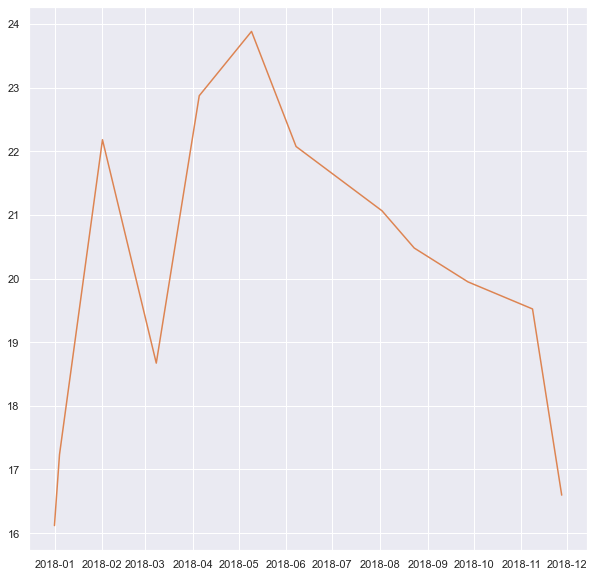

In [302]:
plt.figure(figsize=(10, 10))
plt.plot(np.exp(observs[2].logdpk)[:100])
plt.plot(observs[2].conc_obs[:100])

In [303]:
from scipy.stats import norm

In [288]:
# not covid
perplexities = [np.nanmean(np.log(norm.pdf((np.log(observs[i].conc_obs) - observs[i].logdpk) / observs[i].logdpk_std))) for i in range(len(observs))]
perplexities, np.nanmean(np.ma.masked_invalid(perplexities))

c:\Users\ATMal\Documents\2021fall\NASA-GEOS\.venv\lib\site-packages\pandas\core\arraylike.py:364: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\ATMal\Documents\2021fall\NASA-GEOS\.venv\lib\site-packages\pandas\core\arraylike.py:364: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
C:\Users\ATMal\AppData\Local\Temp/ipykernel_10416/825754122.py:2: RuntimeWarning: Mean of empty slice
  perplexities = [np.nanmean(np.log(norm.pdf((np.log(observs[i].conc_obs) - observs[i].logdpk) / observs[i].logdpk_std))) for i in range(len(observs))]
C:\Users\ATMal\AppData\Local\Temp/ipykernel_10416/825754122.py:2: RuntimeWarning: divide by zero encountered in log
  perplexities = [np.nanmean(np.log(norm.pdf((np.log(observs[i].conc_obs) - observs[i].logdpk) / observs[i].logdpk_std))) for i in range(len(observs))]


([-1.8644726196804808,
  -3.1612485066922904,
  nan,
  -inf,
  -2.0564876092262323,
  -inf,
  -2.32671900528416,
  -1.4777009781445714,
  nan,
  -1.8684225453392376,
  -1.5101465884122154,
  -2.287609380098589,
  -2.633360036737835,
  -2.067458573667935,
  -3.571503582634868,
  -1.4751199257884933,
  -1.2530378514599114,
  nan,
  -1.833442435932432,
  -2.0086414204021072,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  nan,
  -1.7695300292573737,
  -2.4823448951537954,
  nan,
  nan,
  -1.912219708639648,
  -3.2393809337319968,
  -1.7869399356905535,
  nan,
  nan,
  nan,
  -2.1104561573030316,
  -1.8846585712894581],
 -2.1173136950257825)

In [304]:
# covid
perplexities = [np.nanmean(np.log(norm.pdf((np.log(observs[i].conc_obs) - observs[i].logdpk) / observs[i].logdpk_std))) for i in range(len(observs))]
perplexities, np.nanmean(np.ma.masked_invalid(perplexities))

c:\Users\ATMal\Documents\2021fall\NASA-GEOS\.venv\lib\site-packages\pandas\core\arraylike.py:364: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\ATMal\Documents\2021fall\NASA-GEOS\.venv\lib\site-packages\pandas\core\arraylike.py:364: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
C:\Users\ATMal\AppData\Local\Temp/ipykernel_10416/1550307526.py:2: RuntimeWarning: Mean of empty slice
  perplexities = [np.nanmean(np.log(norm.pdf((np.log(observs[i].conc_obs) - observs[i].logdpk) / observs[i].logdpk_std))) for i in range(len(observs))]
C:\Users\ATMal\AppData\Local\Temp/ipykernel_10416/1550307526.py:2: RuntimeWarning: divide by zero encountered in log
  perplexities = [np.nanmean(np.log(norm.pdf((np.log(observs[i].conc_obs) - observs[i].logdpk) / observs[i].logdpk_std))) for i in range(len(observs))]


([-1.8861342728780288,
  -3.5937260875270227,
  nan,
  -inf,
  -1.9219500528853095,
  -inf,
  -2.675422282434507,
  nan,
  -inf,
  -1.6990863059952759,
  -1.596522244508183,
  nan,
  -4.580344955955339,
  nan,
  -3.7899000511168297,
  -1.680515194177724,
  -inf,
  -1.7919507130536831,
  -2.507496897929756,
  -1.903877283011029,
  -2.071517223411681,
  -1.742918698605083,
  -2.298126674082331,
  -6.427267513849597,
  -1.5676066796159478,
  -1.6487611773207953,
  -1.3340382916697637,
  -1.1852882890046015,
  -1.3513547607824505,
  -inf,
  -1.2074467715151473,
  nan,
  -inf,
  -inf,
  -1.8377595525733763,
  -1.487685752153111,
  -inf,
  -3.3220188001069655,
  nan,
  -inf],
 -2.2843486610465416)

In [342]:
from scipy.stats import pearsonr

In [346]:
x = np.ma.masked_invalid(observs[0].conc_obs[:700 * 24])
pearsonr(x, np.arange(len(x)))

(-0.11054018543917529, 7.910105947745499e-47)

In [347]:
observs[0]

,ISO8601,original_station_name,lat,lon,obstype,conc_obs,conc_obs.1,conc_unit,error,logdpk,logdpk_std
ISO8601,,,,,,,,,,,
2017-12-31 23:00:00,2017-12-31 23:00:00,EEA_DE_DE_DEBY089,48.1732,11.648,no2,21.6356,21.6356,ppbv,NaN,NaN,NaN
2018-01-01 00:00:00,2018-01-01 00:00:00,EEA_DE_DE_DEBY089,48.1732,11.648,no2,15.9093,15.9093,ppbv,NaN,NaN,NaN
2018-01-01 01:00:00,2018-01-01 01:00:00,EEA_DE_DE_DEBY089,48.1732,11.648,no2,8.5806,8.5806,ppbv,NaN,NaN,NaN
2018-01-01 02:00:00,2018-01-01 02:00:00,EEA_DE_DE_DEBY089,48.1732,11.648,no2,8.2724,8.2724,ppbv,NaN,NaN,NaN
2018-01-01 03:00:00,2018-01-01 03:00:00,EEA_DE_DE_DEBY089,48.1732,11.648,no2,4.3661,4.3661,ppbv,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
2021-03-15 19:00:00,2021-03-15 19:00:00,EEA_DE_DE_DEBY089,48.1732,11.648,no2,7.0053,7.0053,ppbv,NaN,NaN,NaN
2021-03-15 20:00:00,2021-03-15 20:00:00,EEA_DE_DE_DEBY089,48.1732,11.648,no2,7.2926,7.2926,ppbv,NaN,NaN,NaN
2021-03-15 21:00:00,2021-03-15 21:00:00,EEA_DE_DE_DEBY089,48.1732,11.648,no2,6.4840,6.4840,ppbv,NaN,NaN,NaN


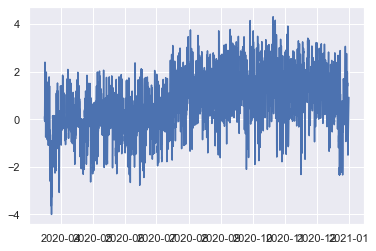

In [340]:
i = 0
plt.plot((np.log(observs[i].conc_obs) - observs[i].logdpk) / observs[i].logdpk_std)

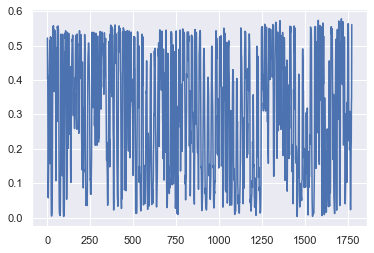

In [290]:
plt.plot([norm.pdf(np.log(observs[i].conc_obs), loc=observs[i].logdpk, scale=observs[i].logdpk_std) for i in range(len(observs))][0])

In [192]:
[norm.pdf(np.log(observs[i].conc_obs), loc=observs[i].logdpk, scale=observs[i].logdpk_std) for i in range(len(observs))]

c:\Users\ATMal\Documents\2021fall\NASA-GEOS\.venv\lib\site-packages\pandas\core\arraylike.py:364: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\ATMal\Documents\2021fall\NASA-GEOS\.venv\lib\site-packages\pandas\core\arraylike.py:364: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


[array([       nan, 0.01865463, 0.01808742, ...,        nan,        nan,
               nan]),
 array([       nan, 0.01887402, 0.01888348, ...,        nan,        nan,
               nan]),
 array([       nan, 0.01875635, 0.0187484 , ...,        nan,        nan,
               nan]),
 array([nan, nan, nan, ..., nan, nan, nan]),
 array([0.01894174, 0.01893331, 0.01892944, ...,        nan,        nan,
               nan]),
 array([nan, nan, nan, ..., nan, nan, nan]),
 array([nan, nan, nan, ..., nan, nan, nan]),
 array([nan, nan, nan, ..., nan, nan, nan]),
 array([0.01889643, 0.01889437, 0.0188942 , ...,        nan,        nan,
               nan]),
 array([nan, nan, nan, ..., nan, nan, nan]),
 array([0.01880468, 0.01878666, 0.01879559, ...,        nan,        nan,
               nan]),
 array([0.01888075, 0.01888291, 0.01887591, ...,        nan,        nan,
               nan])]